<h1>Pneumonia Detector from X-ray Images</h1>

<h2>Background:</h2>

Chest radiography (X-ray) remains the most common radiological exam in the world and done as 
a first screening tool for a wide range of conditions (Raoof et al., 2012). In 2006, it is estimated 
that 129 million CXR images were acquired in the United States alone. The demand comes from 
low-cost and low radiation dose, and reasonable sensitivity to a wide variety of pathologies. 

The interpretation of the chest radiograph can be challenging due to the superimposition of 
anatomical structures along the projection direction. This effect can make it very difficult to 
detect abnormalities in particular locations. This causes radiologists to show high inter-observer 
variability in their analysis of the images (Balabanova et al., 2005). 

The volume of images acquired, the complexity of their interpretation, and their value in clinical 
practice have long motivated researchers to build automated algorithms for analysis. 
The trend in using modern machine learning techniques started in 2017 when NIH released 
112,000 images from NIH clinical centers. And in 2019 more than 750,000 additional images 
were released in 3 labeled datasets. 

The potential gains from ML-based automated analysis include increased sensitivity for subtle 
findings, prioritization of time-sensitive cases, automation of tedious daily tasks, and provision 
of analysis in situations where radiologists are not available. In addition, such tools can also be a 
first step before an experienced doctors reviews the result. It would increase confidence and 
reduce overall false positive or false negative diagnosis. 



<h2>Problem Statement:</h2>

The goal is to reliably predict the probability of Pneumonia in a patient from the chest x-ray. 
While many papers are published in this field. It seems the focus has been on architecture of 
CNN that can achieve the classification. While in medical field an accurate estimate of the 
probability is critical when making diagnosis. 


<h2> Solution Statement:</h2>

We intend to train a CNN model to classify the X-ray images into Normal and Pneumonia. For more efficient and faster training we load weights from a pre-trained ResNet model. A softmax at the output of the last layer gives us the uncalibrated probabilities of the Pneumonia vs. Normal.

We train another model using [beta calibration model](https://proceedings.mlr.press/v54/kull17a.html) to go from uncalibrated probabilities into calibrated probabilities. The concept for calibration is the if for example the probability of Pneumonia is $p \%$ for some patients, we expect that actually $p \%$ of such patients have Pneumonia. This is a much more useful information to the physician that need to make decisions for the patient.

To calibrate this second model, we first need to split our training dataset into train and calibration sets. The calibration set does not need to be large as there are not so many parameters to tune.

After the calibration model is trained/fitted. The outputs of the CNN is softmaxed and passed to the calibration model to determine the probability of the Pneumonia from the patient's X-ray.

<h2>Datasets:</h2>

There are several chest X-ray datasets available from different sources. We downloaded this [Dataset](https://www.kaggle.com/datasets/alifrahman/chestxraydataset) from Kaggle. The Original source of data is University of California San Diego in [here](https://data.mendeley.com/datasets/rscbjbr9sj/2)

The dataset consist of 5840 total 2D Black and White X-ray images. The dimension of the images 
varies in the dataset and therefore a consistent resizing is needed. The dimensions are in the 
range of (900 to 1400) x (600 to 1300). When doing resizing we should take note of possible 
image aliasing and apply necessary smoothing filters if needed. 

The labels are binary as NORMAL and PNEUMONIA. The train dataset has 3875/5216 images of 
PNEUMONIA and 1341/5216 of NORMAL. The test dataset 390/624 PNEUMONIA and 234/624 
NORMAL images. 

From the train dataset we pick 100 random images from Normal and 100 random images from Pneumonia and use them only for training the calibration model.

<h2>Benchmark Model:</h2>

 For accuracy, precision, recall the model would be compared to: [Kermany et. al.](https://www.cell.com/cell/fulltext/S0092-8674(18)30154-5)

The benchmark for probability calibration is the dataset itself through a reliability diagram on the test dataset. 

<h2>Evaluation Metrics:</h2>


- a. Accuracy, Precision, Recall, F1-score :

    The overall accuracy of model should be high for the probability calibration to work properly. In 
this application Precision and Recall are both important as both False Positives and False 
Negative can impact the medical procedures that would be applied or not applied to a patient. 
Therefore, a combined F1-score can also be a suitable metric. 


- b. Reliability Diagram :

    We will look at probability diagram over the entire dataset. Make predictions based on calibrated probabilities and discuss the results.


<h3>Install and import on the instance</h3>

In [6]:
%%capture
import sys
!{sys.executable} -m pip install smdebug torch torchvision tqdm opendatasets betacal ml-insights==0.1.8


In [3]:
import ml_insights
ml_insights.__version__

'0.1.8'

In [56]:
import os
import boto3
import sagemaker
from sagemaker.tuner import CategoricalParameter, ContinuousParameter, HyperparameterTuner
from sagemaker.pytorch import PyTorch
from sagemaker import get_execution_role
from sagemaker.debugger import Rule, DebuggerHookConfig, TensorBoardOutputConfig, CollectionConfig, ProfilerRule, rule_configs, ProfilerConfig, FrameworkProfile
from sagemaker.analytics import HyperparameterTuningJobAnalytics
import opendatasets as op
import numpy as np
import random



<h3>Get the data and copy it to S3</h3>

In [ ]:
%%capture
!pip install -U sagemaker

Download the data into notebook instance

In [6]:
op.download('https://www.kaggle.com/datasets/tolgadincer/labeled-chest-xray-images')


100%|██████████| 1.17G/1.17G [00:10<00:00, 120MB/s] 


Copy the data into S3 bucket...

In [5]:
session = sagemaker.Session()
bucket = session.default_bucket()
region = session.boto_region_name
role = sagemaker.get_execution_role()

os.environ["DEFAULT_S3_BUCKET"] = bucket

In [9]:
%%capture

!aws s3 sync ./labeled-chest-xray-images s3://${DEFAULT_S3_BUCKET}/chestCRXImages/


In [6]:
print(bucket)

s3bucket = os.path.join("s3://", bucket)
print(s3bucket)

s3datapath = os.path.join(s3bucket, "chestCRXImages/chest_xray")
print(s3datapath)

sagemaker-us-east-1-286375333242
s3://sagemaker-us-east-1-286375333242
s3://sagemaker-us-east-1-286375333242/chestCRXImages/chest_xray


Make a list of all the NORMAL and PNEUMONIA images in the train dataset. This is used to split the train dataset randomly into train and calibration...

In [7]:
s3 = boto3.resource('s3')
my_bucket = s3.Bucket(bucket)
NORMAL_images = []

for object_summary in my_bucket.objects.filter(Prefix="chestCRXImages/chest_xray/train/NORMAL"):
    #print(object_summary.key)
    NORMAL_images.append(object_summary.key)
    

PNEUMONIA_images = []
for object_summary in my_bucket.objects.filter(Prefix="chestCRXImages/chest_xray/train/PNEUMONIA"):
    #print(object_summary.key)
    PNEUMONIA_images.append(object_summary.key)
    

In [8]:
print(len(NORMAL_images))
print(len(PNEUMONIA_images))

1349
3883


In [12]:
Normal_len = len(NORMAL_images)
Pneumonia_len = len(PNEUMONIA_images)

Normal_index = random.sample(range(Normal_len), 100)
Pneumonia_index = random.sample(range(Pneumonia_len), 100)

Normal_images_calibration = [NORMAL_images[index] for index in Normal_index]
Pneumonia_images_calibration = [PNEUMONIA_images[index] for index in Pneumonia_index]

Calibration_images = Normal_images_calibration + Pneumonia_images_calibration

print("Moving some random files into Calibration folder...")
print("Bucker is " + bucket)
target_str = 'train/'
for image_name in Calibration_images:
    s_pos = image_name.index(target_str)
    new_image_name = image_name[:s_pos] + "Calibration/" + image_name[s_pos + len(target_str):]
    source_loc = bucket + '/' + image_name
    print('----------------------------')
    print("Moving " + source_loc + " to " + new_image_name)
    s3.Object(bucket, new_image_name).copy_from(CopySource=source_loc);
    print("Deleting " + source_loc)
    s3.Object(bucket, source_loc).delete();

Moving some random files into Calibration folder...
Bucker is sagemaker-us-east-1-286375333242
----------------------------
Moving sagemaker-us-east-1-286375333242/chestCRXImages/chest_xray/train/NORMAL/NORMAL-824917-0003.jpeg to chestCRXImages/chest_xray/Calibration/NORMAL/NORMAL-824917-0003.jpeg
Deletingsagemaker-us-east-1-286375333242/chestCRXImages/chest_xray/train/NORMAL/NORMAL-824917-0003.jpeg
----------------------------
Moving sagemaker-us-east-1-286375333242/chestCRXImages/chest_xray/train/NORMAL/NORMAL-7298141-0001.jpeg to chestCRXImages/chest_xray/Calibration/NORMAL/NORMAL-7298141-0001.jpeg
Deletingsagemaker-us-east-1-286375333242/chestCRXImages/chest_xray/train/NORMAL/NORMAL-7298141-0001.jpeg
----------------------------
Moving sagemaker-us-east-1-286375333242/chestCRXImages/chest_xray/train/NORMAL/NORMAL-4969331-0001.jpeg to chestCRXImages/chest_xray/Calibration/NORMAL/NORMAL-4969331-0001.jpeg
Deletingsagemaker-us-east-1-286375333242/chestCRXImages/chest_xray/train/NORMAL/

Now the data is ready on S3 and is plit into train, calibration, and test and ready for training.

<h3>Data Exploration</h3>

To keep the notebook simplier and easier to follow the data exploration is skipped. X-ray images would be shown later in the notebook when inference is done.

Early on exploration of the X-ray images showed that two main pre-processing need to happen:
- Resizing the images because the size of input images can vary
- Since there are BW and our pre-trained model is for 3-color channel images, we need to convert the images from BW to RGB. When using a dataloader from pytorch during the script training, this is done automatically - But when we want to send the image data to the endpoint for inference we need to explicity to this conversion as we will see later in the notebook.

<h2>Data Exploration</h2>

First, we do a hyper-parameter tuning of the model. 

The training script is in CNN_training.py
It is based on ResNet50 pre-trained model. The last dense/Fully-connected layer is replaced by two layers. One with 128 nodes and the last layer is with two nodes for the binary classification. The code is uploaded to the github folder.

For hyper-parameter tuning we can search for optimum values of learning rate and batch size, while aiming to minimize the testing loss.

<h3>Hyper-parameter Tuning</h3>

In [13]:
hyperparameter_ranges = {
    "learning_rate": ContinuousParameter(0.001, 0.01),
    "batch_size": CategoricalParameter([16, 32, 64, 128]),
}

role = sagemaker.get_execution_role()

objective_metric_name = "Test Loss"
objective_type = "Minimize"
metric_definitions = [{"Name": "Test Loss", "Regex": "Testing Loss: ([0-9\\.]+)"}]

In [14]:
estimator = PyTorch(
    entry_point="CNN_training.py",
    base_job_name='CRX_Pneumonia',
    role=role,
    framework_version="1.8",
    instance_count=1,
    instance_type="ml.m5.large",
    py_version='py36'
)

tuner = HyperparameterTuner(
    estimator,
    objective_metric_name,
    hyperparameter_ranges,
    metric_definitions,
    max_jobs=2,
    max_parallel_jobs=1,  # you once have one ml.g4dn.xlarge instance available
    objective_type=objective_type
)

<h3>Fit the tuner</h3>

In [14]:
os.environ['SM_CHANNEL_TRAINING']=s3datapath
os.environ['SM_MODEL_DIR']=os.path.join(s3datapath, "model")#'s3://udacitysolution/model/'
os.environ['SM_OUTPUT_DATA_DIR']=os.path.join(s3datapath, "output")#'s3://udacitysolution/output/'
tuner.fit({"training": s3datapath})

No finished training job found associated with this estimator. Please make sure this estimator is only used for building workflow config
No finished training job found associated with this estimator. Please make sure this estimator is only used for building workflow config


........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

In [15]:
#or find under sagemaker hyper-parameter tuning jobs if kernel dies

#latest_tuning_job_name = tuner.latest_tuning_job.name
latest_tuning_job_name = "pytorch-training-220921-0404"

print(latest_tuning_job_name)

pytorch-training-220921-0404


<h3>Tuning results</h3>


In [16]:
exp = HyperparameterTuningJobAnalytics(
  hyperparameter_tuning_job_name=latest_tuning_job_name)

jobs = exp.dataframe()

jobs.sort_values('FinalObjectiveValue', ascending=0)

,batch_size,learning_rate,TrainingJobName,TrainingJobStatus,FinalObjectiveValue,TrainingStartTime,TrainingEndTime,TrainingElapsedTimeSeconds
1,"""32""",0.003989,pytorch-training-220921-0404-001-55d34e19,Completed,14.0,2022-09-21 04:06:47+00:00,2022-09-21 04:46:59+00:00,2412.0
0,"""32""",0.006130,pytorch-training-220921-0404-002-551b9194,Completed,12.0,2022-09-21 04:54:43+00:00,2022-09-21 05:34:03+00:00,2360.0


## Imp: If kernel dies, load from sagemaker

In [17]:
BetterTrainingJobName='pytorch-training-220921-0404-002-551b9194'
my_estimator = sagemaker.estimator.Estimator.attach(BetterTrainingJobName)
my_estimator.hyperparameters()
best_estimator=my_estimator


2022-09-21 05:34:06 Starting - Found matching resource for reuse
2022-09-21 05:34:06 Downloading - Downloading input data
2022-09-21 05:34:06 Training - Training image download completed. Training in progress.
2022-09-21 05:34:06 Uploading - Uploading generated training model
2022-09-21 05:34:06 Completed - Resource released due to keep alive period expiry


<h3>Model training with the best hyper-parameters</h3>

In [ ]:
best_estimator=tuner.best_estimator()

In [18]:
best_estimator.hyperparameters()

{'_tuning_objective_metric': 'Test Loss',
 'batch_size': '"32"',
 'learning_rate': '0.0061302077895518114',
 'sagemaker_container_log_level': '20',
 'sagemaker_estimator_class_name': '"PyTorch"',
 'sagemaker_estimator_module': '"sagemaker.pytorch.estimator"',
 'sagemaker_job_name': '"CRX_Pneumonia-2022-09-21-04-04-41-276"',
 'sagemaker_program': '"CNN_training.py"',
 'sagemaker_region': '"us-east-1"',
 'sagemaker_submit_directory': '"s3://sagemaker-us-east-1-286375333242/CRX_Pneumonia-2022-09-21-04-04-41-276/source/sourcedir.tar.gz"'}

In [19]:
hyperparameters = {"batch_size": int(best_estimator.hyperparameters()['batch_size'].replace('"', '')), \
                   "lr": best_estimator.hyperparameters()['learning_rate'],
                   "epochs" : 5}
hyperparameters

{'batch_size': 32, 'lr': '0.0061302077895518114', 'epochs': 5}

<h3>Setting up debugger and profiler for the training job</h3>

In [20]:
rules = [
    Rule.sagemaker(rule_configs.vanishing_gradient()),
    Rule.sagemaker(rule_configs.overfit()),
    Rule.sagemaker(rule_configs.overtraining()),
    Rule.sagemaker(rule_configs.poor_weight_initialization()),
    ProfilerRule.sagemaker(rule_configs.ProfilerReport()),
]

In [21]:
hook_config = DebuggerHookConfig(
    hook_parameters={
        "train.save_interval": "1",
        "eval.save_interval": "1"
    }
)

profiler_config = ProfilerConfig(
    system_monitor_interval_millis=500, framework_profile_params=FrameworkProfile(num_steps=1)
)

<h2>Creating an Estimator</h2>

In [22]:
estimator = PyTorch(
    entry_point='CNN_training.py',
    base_job_name='CXR-Pneumonia',
    role=role,
    instance_count=1,
    instance_type='ml.p3.2xlarge',
    framework_version='1.8',
    py_version='py36',
    hyperparameters=hyperparameters,
    ## Debugger and Profiler parameters
    rules = rules,
    debugger_hook_config=hook_config,
    profiler_config=profiler_config,
)

<h3>Training the model</h3>

In [23]:
estimator.fit({"training": s3datapath}, wait = True)

2022-09-28 07:17:57 Starting - Starting the training job...
2022-09-28 07:18:23 Starting - Preparing the instances for trainingVanishingGradient: InProgress
Overfit: InProgress
Overtraining: InProgress
PoorWeightInitialization: InProgress
ProfilerReport: InProgress
.........
2022-09-28 07:19:57 Downloading - Downloading input data.........
2022-09-28 07:21:18 Training - Downloading the training image.....................
2022-09-28 07:24:59 Training - Training image download completed. Training in progress..bash: cannot set terminal process group (-1): Inappropriate ioctl for device
bash: no job control in this shell
2022-09-28 07:24:56,447 sagemaker-training-toolkit INFO     Imported framework sagemaker_pytorch_container.training
2022-09-28 07:24:56,479 sagemaker_pytorch_container.training INFO     Block until all host DNS lookups succeed.
2022-09-28 07:24:56,486 sagemaker_pytorch_container.training INFO     Invoking user training script.
2022-09-28 07:24:57,036 sagemaker-training-too

<h2>Training results</h2>

We get around 85% accuracy compared to 90% from the benchmark paper. We could perhaps make the model deeper or increase the training loss to improve the result. It could also be that since we dedicated almost 10% of our Pneumonia images for probability calibration, we did not have enough positive samples for the model to learn.

However, we could also be satisfied with the result. Although, the benchmark reports higher accuracy it does not necessarily be a good model for predicting the probability of Pneumonia in a patient.

<h2>Deploy the model</h2>

We deploy the model to an endpoint to use it for inference and calibration:

In [24]:
model_location=estimator.model_data
print("Mode data in case of reload or if the kernel dies before deployment:")
print(model_location)

Mode data in case of reload or if the kernel dies before deployment:
s3://sagemaker-us-east-1-286375333242/CXR-Pneumonia-2022-09-28-07-17-57-174/output/model.tar.gz


In [17]:
import sagemaker
import boto3
from sagemaker.tuner import CategoricalParameter, ContinuousParameter, HyperparameterTuner
from sagemaker.pytorch import PyTorch
from sagemaker import get_execution_role
from sagemaker.debugger import Rule, DebuggerHookConfig, TensorBoardOutputConfig, CollectionConfig, ProfilerRule, rule_configs
from sagemaker.debugger import ProfilerConfig, FrameworkProfile

from sagemaker.pytorch import PyTorchModel
from sagemaker.predictor import Predictor


In [18]:
jpeg_serializer = sagemaker.serializers.IdentitySerializer("image/jpeg")
json_deserializer = sagemaker.deserializers.JSONDeserializer()

class ImagePredictor(Predictor):
    def __init__(self, endpoint_name, sagemaker_session):
        super(ImagePredictor, self).__init__(
            endpoint_name,
            sagemaker_session=sagemaker_session,
            serializer=jpeg_serializer,
            deserializer=json_deserializer,
        )

In [27]:
pytorch_model = PyTorchModel(model_data=model_location, role=role, entry_point='inference.py',py_version='py36',
                             framework_version='1.8',
                             predictor_cls=ImagePredictor)

In [28]:
predictor = pytorch_model.deploy(initial_instance_count=1, instance_type='ml.m5.large')


------!

In [14]:
#endpoint_name = predictor.endpoint_name
endpoint_name = "pytorch-inference-2022-09-28-07-40-07-421"

print("The endpoint name is:")
print(endpoint_name)

The endpoint name is:
pytorch-inference-2022-09-28-07-40-07-421


Run this cell if the kernel dies but the endpoint is still active:

In [19]:
predictor = sagemaker.predictor.Predictor(
                                          endpoint_name = endpoint_name,
                                          sagemaker_session = session,
                                          serializer = jpeg_serializer,
                                          deserializer = json_deserializer  
                                          )

<h1>Probability Calibration</h1>

Now, we start on training the calibration model.
First, we create a list of all the X-ray images we have available for training the model:

In [9]:
s3 = boto3.resource('s3')
my_bucket = s3.Bucket(bucket)
Normal_images_calibration = []

for object_summary in my_bucket.objects.filter(Prefix="chestCRXImages/chest_xray/Calibration/NORMAL"):
    #print(object_summary.key)
    Normal_images_calibration.append(object_summary.key)
    

Pneumonia_images_calibration = []
for object_summary in my_bucket.objects.filter(Prefix="chestCRXImages/chest_xray/Calibration/PNEUMONIA"):
    #print(object_summary.key)
    Pneumonia_images_calibration.append(object_summary.key)
    
print(f"Number of Normal Images available for calibration: {len(Normal_images_calibration)}")
print(f"Number of PNEUMONIA Images available for calibration: {len(Pneumonia_images_calibration)}")

Number of Normal Images available for calibration: 99
Number of PNEUMONIA Images available for calibration: 99


Creating a list of all the images (to be sent to the endpoint for inference) and their labels (from their folder)

In [10]:
cal_data = []
cal_y = []
for image_name in Normal_images_calibration:
    image_label = 0
    cal_data.append(image_name)
    cal_y.append(image_label)
    #print('----------------------------')
    #print("Image: " + image_name)
    #print("Label: " + str(image_label))

for image_name in Pneumonia_images_calibration:
    image_label = 1
    cal_data.append(image_name)
    cal_y.append(image_label)
    #print('----------------------------')
    #print("Image: " + image_name)
    #print("Label: " + str(image_label))

<h2>Testing the endpoint and visualizing the results</h2>

First step is to send the images in the calibration dataset to the model (endpoint) and calulate the probability of the Pneumonia. 

Since the last of the CNN was outputing the logits, we need to take the softmax to get the probabilty. 

We store the uncalibrated probability of the entire calibration dataset into a list.

For visualization for the first 3 images the X-ray image is shown. For the rest only the predicted label (NORMAL vs. PNEUMONIA) and the uncalibrated probability of PNEUMONIA is printed.

In [12]:
def softmax(x):
    return np.exp(x) / np.sum(np.exp(x), axis=0)

--------------------------
Image: chestCRXImages/chest_xray/Calibration/NORMAL/NORMAL-1044645-0001.jpeg
Label: 0


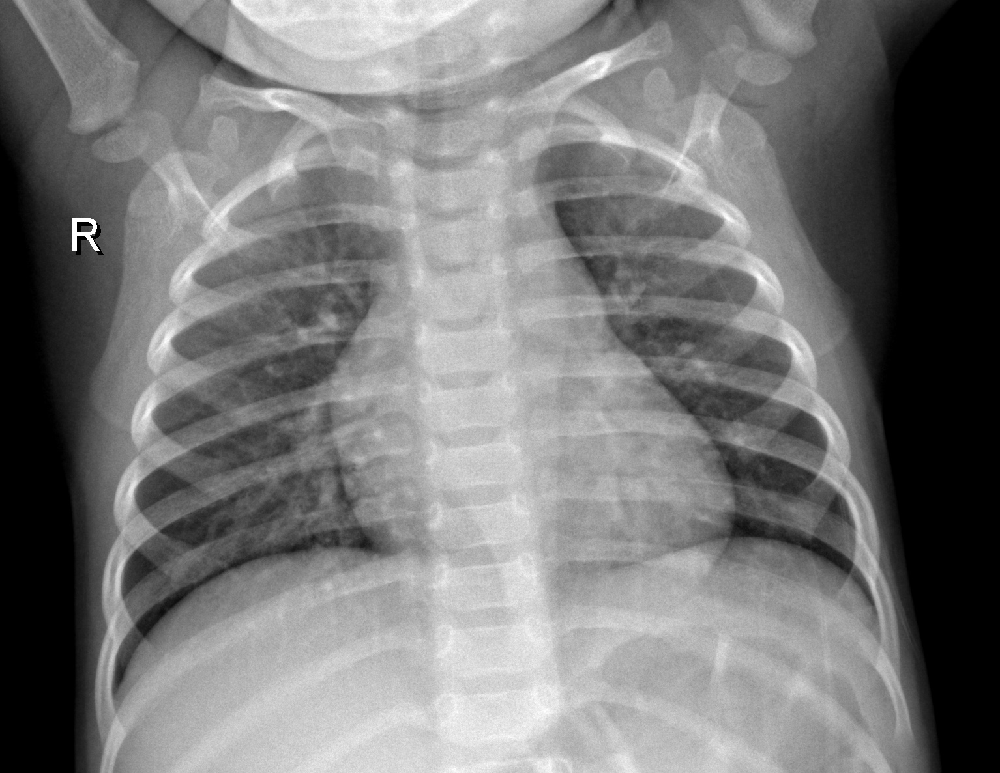

Uncalibrated Pneumonia Probability: 0.08247949068642986
Prediction is: NORMAL
--------------------------
Image: chestCRXImages/chest_xray/Calibration/NORMAL/NORMAL-1101909-0001.jpeg
Label: 0


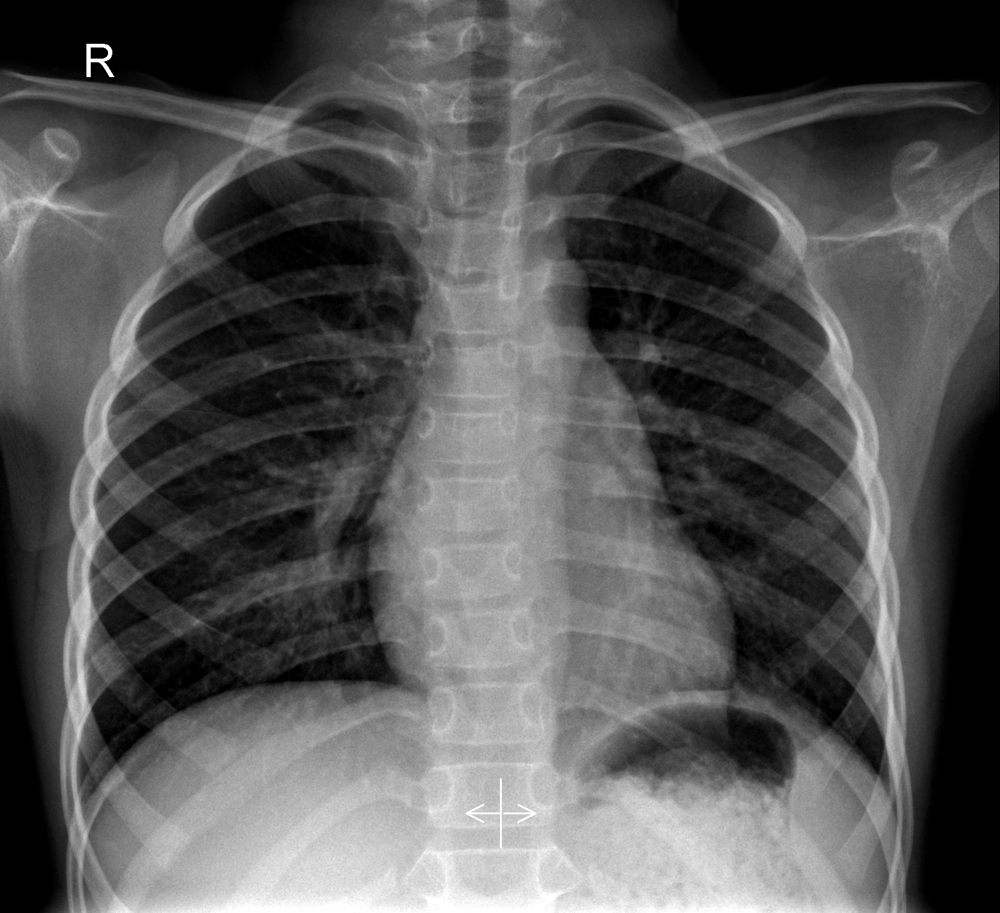

Uncalibrated Pneumonia Probability: 0.5358327650468722
Prediction is: PNEUMONIA
--------------------------
Image: chestCRXImages/chest_xray/Calibration/NORMAL/NORMAL-1128157-0001.jpeg
Label: 0


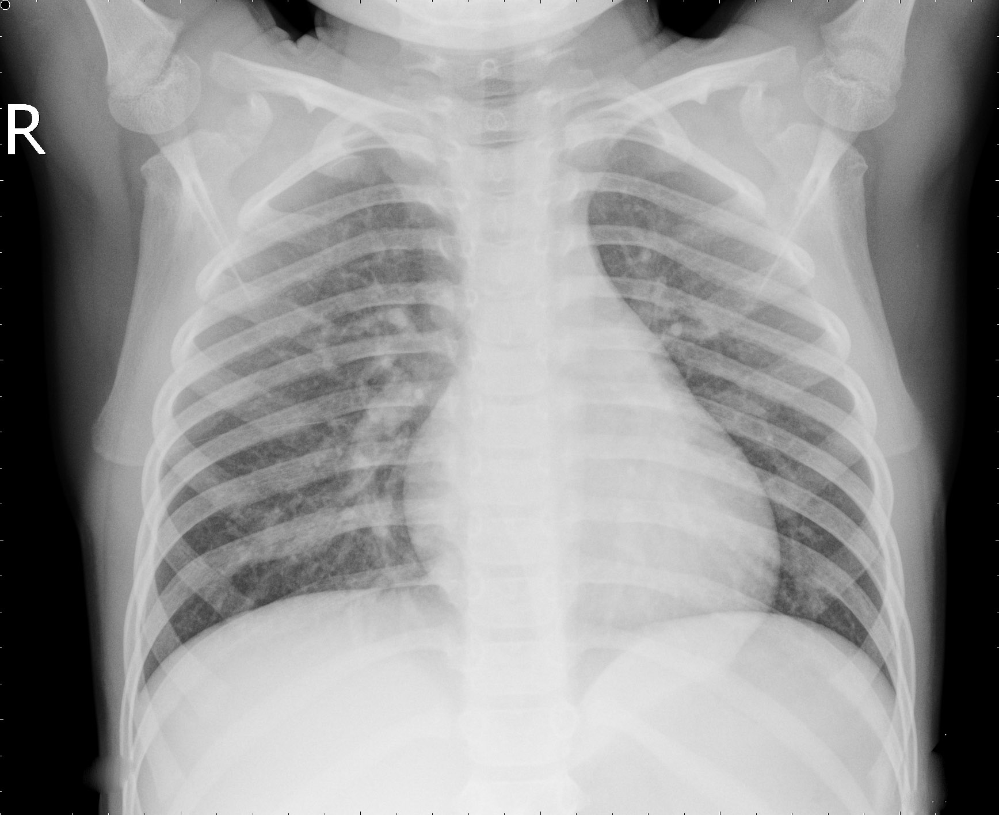

Uncalibrated Pneumonia Probability: 0.5488907091728171
Prediction is: PNEUMONIA
--------------------------
Image: chestCRXImages/chest_xray/Calibration/NORMAL/NORMAL-1455093-0001.jpeg
Label: 0
Uncalibrated Pneumonia Probability: 0.1992966265915107
Prediction is: NORMAL
--------------------------
Image: chestCRXImages/chest_xray/Calibration/NORMAL/NORMAL-1522956-0001.jpeg
Label: 0
Uncalibrated Pneumonia Probability: 0.1827606288369004
Prediction is: NORMAL
--------------------------
Image: chestCRXImages/chest_xray/Calibration/NORMAL/NORMAL-1602738-0002.jpeg
Label: 0
Uncalibrated Pneumonia Probability: 0.06274437966081287
Prediction is: NORMAL
--------------------------
Image: chestCRXImages/chest_xray/Calibration/NORMAL/NORMAL-1696866-0001.jpeg
Label: 0
Uncalibrated Pneumonia Probability: 0.055224822244688776
Prediction is: NORMAL
--------------------------
Image: chestCRXImages/chest_xray/Calibration/NORMAL/NORMAL-1739213-0001.jpeg
Label: 0
Uncalibrated Pneumonia Probability: 0.153495

In [20]:
from sagemaker.serializers import IdentitySerializer
from PIL import Image

predictor.serializer = IdentitySerializer("image/jpeg")
jpeg_serializer = IdentitySerializer("image/jpeg")

session = boto3.Session()
s3_client = session.client('s3')
s3 = boto3.resource('s3')   

bucket_name = bucket
bucket_ = s3.Bucket(bucket_name)
count = 0
uncalibrated_Pneumonia_probabilities_cal = []
for file, label in zip(cal_data, cal_y):
    print("--------------------------")
    print("Image: " + file)
    print("Label: " + str(label))
    object = bucket_.Object(file)
    response = object.get()
    file_stream = response['Body']
    img = Image.open(file_stream).convert('RGB')
    if count < 3:
        display(img)
    count += 1
    
    s3_object = s3_client.get_object(Bucket = bucket_name, Key = file)
    body = s3_object['Body']
    content = body.read()
    response = predictor.predict(content, initial_args={'ContentType':'image/jpeg'})
    probs = softmax(response[0])
    uncalibrated_Pneumonia_probability = probs[1]
    print("Uncalibrated Pneumonia Probability: " + str(uncalibrated_Pneumonia_probability))
    uncalibrated_Pneumonia_probabilities_cal.append(uncalibrated_Pneumonia_probability)
    prediction = np.argmax(response[0]) + 1 
    prediction = 'NORMAL' if np.argmax(response[0]) == 0 else 'PNEUMONIA' 
    print("Prediction is: " + prediction)
    

The calibration dataset does not have many samples and its visualization may not show enough information. However, we can still get an idea before looking into the entire test dataset and before calibration the probabilities.

We can see the most of the images result in either high probability or low probability, however these regions are important for calibration purposes and cannot be ignored as most of the physician errors coudl come from these areas. For other sections with not much points the data could be noisy. 

In general from the figure we can learn that our current model over-estimated the probability of Pneumonia from the X-ray images as the predicted probabilties are generally higher than actual probabilties.

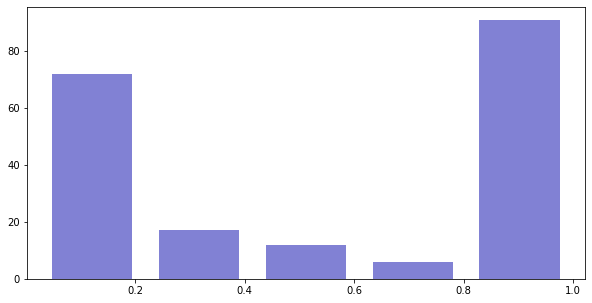

<Figure size 720x360 with 0 Axes>

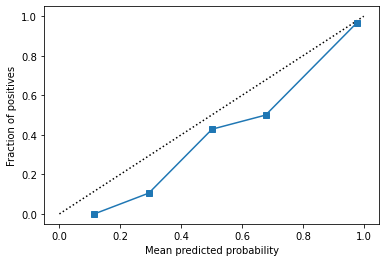

In [22]:
import matplotlib.pyplot as plt
from sklearn.calibration import calibration_curve, CalibrationDisplay


plt.figure(figsize=(10,5))
n, bins, patches = plt.hist(x=uncalibrated_Pneumonia_probabilities_cal, bins=5, color='#0504aa', alpha=0.5, rwidth=0.75)

plt.figure(figsize=(10,5))
prob_true, prob_pred = calibration_curve(cal_y, uncalibrated_Pneumonia_probabilities_cal, n_bins=5)

disp = CalibrationDisplay(prob_true, prob_pred, uncalibrated_Pneumonia_probabilities_cal)
disp.plot()

<h2>Beta Calibration:</h2>
    
We send the uncalibrated Pneumonia probabilties and the true label for each image to a Beta Calibration model that we imported to train the calibration model.

There are several other calibration models such as [Platt](https://en.wikipedia.org/wiki/Platt_scaling), [Spline](https://arxiv.org/abs/1809.07751), and [Isotonic](https://en.wikipedia.org/wiki/Isotonic_regression).

For the purpose of this project we only focus on beta calibration.

After fitting the model, we can then use the predict method of the model and use it to convert the uncalibrated probability of the CNN into a calibrated Probability.

<h2>Note:</h2>
We could do all these inside the training script and deploy the calibration model as part of the endpoint. The calibration dataset could be sent into the training instance in a new channel and everything would work the same way. However, we could not have the visualization and follow the steps. In real production, we would do that as part of the script.

In [40]:
from betacal import BetaCalibration

betaCalibration = BetaCalibration()
betaCalibration.fit(uncalibrated_Pneumonia_probabilities_cal, cal_y)

BetaCalibration()

<h1>Visualizing the results</h1>

To best compare the results we plot probability diagram for uncalibrated and calibrated probabilties of Pneumonia on the entire test dataset. For this we need to call the endpoint on each image on the test dataset.

Creating the list of images in the test dataset together with their labels:


In [24]:
s3 = boto3.resource('s3')
my_bucket = s3.Bucket(bucket)
Normal_images_test = []

for object_summary in my_bucket.objects.filter(Prefix="chestCRXImages/chest_xray/test/NORMAL"):
    Normal_images_test.append(object_summary.key)

Pneumonia_images_test = []
for object_summary in my_bucket.objects.filter(Prefix="chestCRXImages/chest_xray/test/PNEUMONIA"):
    Pneumonia_images_test.append(object_summary.key)
    
print(f"Number of Normal Images available for test: {len(Normal_images_test)}")
print(f"Number of PNEUMONIA Images available for test: {len(Pneumonia_images_test)}")

Number of Normal Images available for test: 234
Number of PNEUMONIA Images available for test: 390


In [27]:
test_data = []
test_y = []
for image_name in Normal_images_test:
    image_label = 0
    test_data.append(image_name)
    test_y.append(image_label)
    #print('----------------------------')
    #print("Image: " + image_name)
    #print("Label: " + str(image_label))

for image_name in Pneumonia_images_test:
    image_label = 1
    test_data.append(image_name)
    test_y.append(image_label)
    #print('----------------------------')
    #print("Image: " + image_name)
    #print("Label: " + str(image_label))

print(f"Total size of test dataset is {len(test_data)}")

Total size of test dataset is 624


Calling the endpoint and storing the calculated uncalibrated Pneumonia probabilties. We skip visualization of the images here and will do it at the end.

In [30]:
from sagemaker.serializers import IdentitySerializer

predictor.serializer = IdentitySerializer("image/jpeg")
jpeg_serializer = IdentitySerializer("image/jpeg")

session = boto3.Session()
s3_client = session.client('s3')
s3 = boto3.resource('s3')   

from PIL import Image
import numpy as np
bucket_name = bucket
bucket_ = s3.Bucket(bucket_name)
count = 0
uncalibrated_Pneumonia_probabilities_test = []
for file, label in zip(test_data, test_y):
    print("--------------------------")
    print("Image: " + file)
    print("Label: " + str(label))
    object = bucket_.Object(file)
    response = object.get()
    file_stream = response['Body']
    img = Image.open(file_stream).convert('RGB')
    #display(img)
    count += 1
    
    s3_object = s3_client.get_object(Bucket = bucket_name, Key = file)
    body = s3_object['Body']
    content = body.read()
    response = predictor.predict(content, initial_args={'ContentType':'image/jpeg'})
    probs = softmax(response[0])
    uncalibrated_Pneumonia_probability = probs[1]
    print("Uncalibrated Pneumonia Probability: " + str(uncalibrated_Pneumonia_probability))
    uncalibrated_Pneumonia_probabilities_test.append(uncalibrated_Pneumonia_probability)
    prediction = np.argmax(response[0]) + 1 
    prediction = 'NORMAL' if np.argmax(response[0]) == 0 else 'PNEUMONIA' 
    print("Prediction is: " + prediction)
    #if count == 5:
     #   break

--------------------------
Image: chestCRXImages/chest_xray/test/NORMAL/NORMAL-1049278-0001.jpeg
Label: 0
Uncalibrated Pneumonia Probability: 0.8147431014939452
Prediction is: PNEUMONIA
--------------------------
Image: chestCRXImages/chest_xray/test/NORMAL/NORMAL-1110860-0001.jpeg
Label: 0
Uncalibrated Pneumonia Probability: 0.26126209169732845
Prediction is: NORMAL
--------------------------
Image: chestCRXImages/chest_xray/test/NORMAL/NORMAL-11419-0001.jpeg
Label: 0
Uncalibrated Pneumonia Probability: 0.10093189776727404
Prediction is: NORMAL
--------------------------
Image: chestCRXImages/chest_xray/test/NORMAL/NORMAL-115218-0001.jpeg
Label: 0
Uncalibrated Pneumonia Probability: 0.4459524603035636
Prediction is: NORMAL
--------------------------
Image: chestCRXImages/chest_xray/test/NORMAL/NORMAL-1160949-0001.jpeg
Label: 0
Uncalibrated Pneumonia Probability: 0.9375761720203815
Prediction is: PNEUMONIA
--------------------------
Image: chestCRXImages/chest_xray/test/NORMAL/NORMAL-1

<h2>Visualizing uncalibrated probability diagram</h2>

Using ml_insight library:

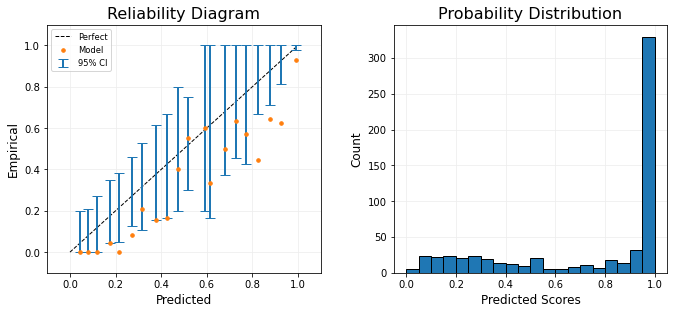

In [34]:
import ml_insights as mli
uncal_prob_test = np.array(uncalibrated_Pneumonia_probabilities_test)
y_test = np.array(test_y)
plt.figure(figsize=(10,5))
mli.plot_reliability_diagram(y_test, uncal_prob_test, show_histogram=True);

Just a side note:

ml_insights library sometime has issues when importing on AWS. We could do the same plots using scikit-learn. Example shown below:

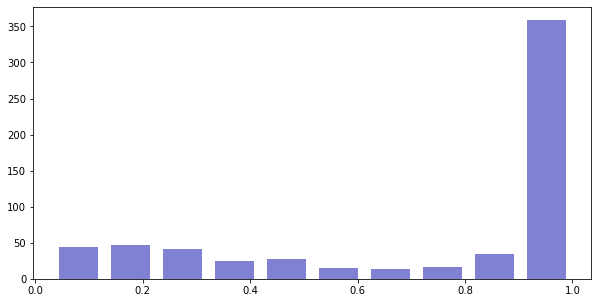

<Figure size 720x360 with 0 Axes>

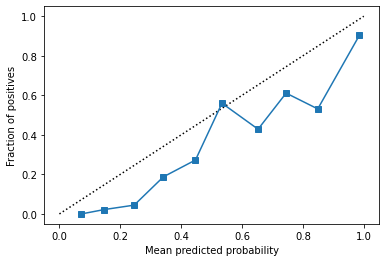

In [49]:
plt.figure(figsize=(10,5))
plt.hist(x=uncalibrated_Pneumonia_probabilities_test, bins=10, color='#0504aa', alpha=0.5, rwidth=0.75);

plt.figure(figsize=(10,5))
prob_true, prob_pred = calibration_curve(test_y, uncalibrated_Pneumonia_probabilities_test, n_bins=10)
disp = CalibrationDisplay(prob_true, prob_pred, uncalibrated_Pneumonia_probabilities_test);
disp.plot()

In [51]:
p1 = np.array(prob_true)
p2 = np.array(prob_pred)
error = p1 - p2
error_square = np.square(error)
error_sum_square = np.sum(error_square)
print(f"Uncalibrated probability Sum of Squares: {error_sum_square}")


Uncalibrated probability Sum of Squares: 0.29199751521036654


We note from the result that the uncalibrated probabilities are highly over-estimated as we expected from visualizing the same on the smaller calibration dataset. 

From histogram, we note that we dont have many points in probability regions around 0.6 to 0.8 and this results in noisy points in the calibration diagram. This is an issue with this dataset as even looking at the entire dataset, there are not enough points. However, this does not much affect overal performance and we can focus on regions with more datapoints.

We also defined a metric as Sum of Squared Error that illustrated the difference between predicted and actual probabilities.

<h2>Visualizing uncalibrated probability diagram</h2>

Now, we send the uncalibrated probabilities to the calibration model to get the calibrated probabilties and then visualize the output.

Using scikit-learn:

<Figure size 720x360 with 0 Axes>

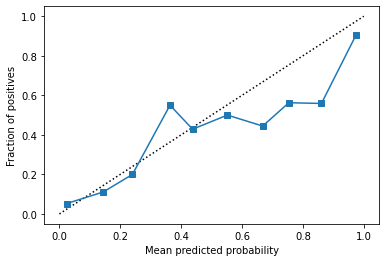

In [52]:
calibrated_Pneumonia_probabilities_test = betaCalibration.predict(uncalibrated_Pneumonia_probabilities_test)
plt.figure(figsize=(10,5))
prob_true, prob_pred = calibration_curve(test_y, calibrated_Pneumonia_probabilities_test, n_bins=10)
disp = CalibrationDisplay(prob_true, prob_pred, calibrated_Pneumonia_probabilities_test)
disp.plot()

Using ml_insight library:

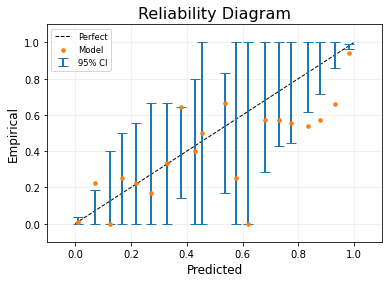

In [53]:
cal_prob_test = np.array(calibrated_Pneumonia_probabilities_test)

mli.plot_reliability_diagram(y_test, cal_prob_test);

In [54]:
p1 = np.array(prob_true)
p2 = np.array(prob_pred)
error = p1 - p2
error_square = np.square(error)
error_sum_square = np.sum(error_square)
print(f"Calibrated probability Sum of Squares: {error_sum_square}")

Calibrated probability Sum of Squares: 0.22386608494114665


We can notice much improvement in the diagram. The points from the model are generally closer to the actual probability.

Our Sum of Squared Error metric is also improved. Although the difference seem small but it is a significant improvement.

<h2>Applying calibration to the endpoint in production</h2>

As noted earlier, we could do the probability calibration inside the script and deploy that together with the CNN model to the endpoint. But we did this in the notebook instance for illustration. 

This could still be a good choice becuase the calibration model can later on be applied to the logits received from the endpoint. Another option is that a Lambda function interfacing with the endpoint can apply the calibration to the endpoint result and return the calibrated probabilities to the client.

For illustration, we randomly select 5 X-ray images from the test dataset, call the endpoint, apply the calibration to the response from the model, and report both calibrated and uncalibrated probabilities. For visualization, the image used for this inference is also shown.

--------------------------
Image: chestCRXImages/chest_xray/test/NORMAL/NORMAL-6395296-0001.jpeg
Label: 0


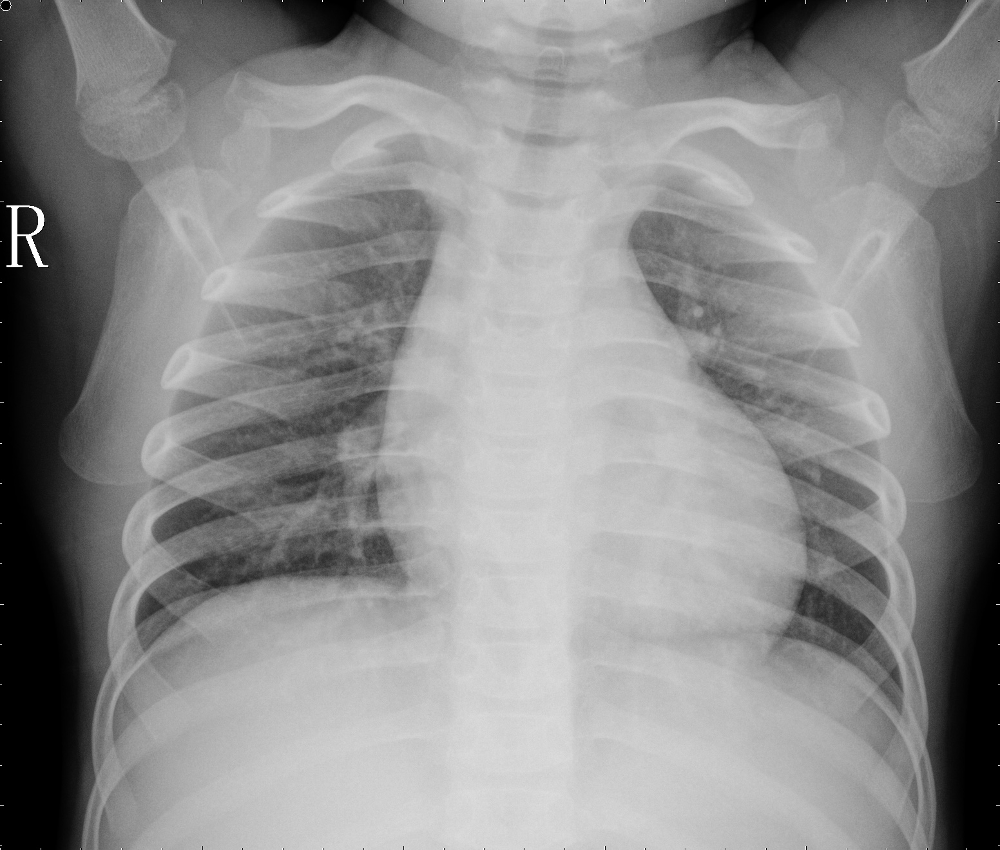

Uncalibrated Pneumonia Probability: 0.7172762632109436
Calibrated Pneumonia Probability: 0.727611282798618
--------------------------
Image: chestCRXImages/chest_xray/test/NORMAL/NORMAL-7165123-0001.jpeg
Label: 0


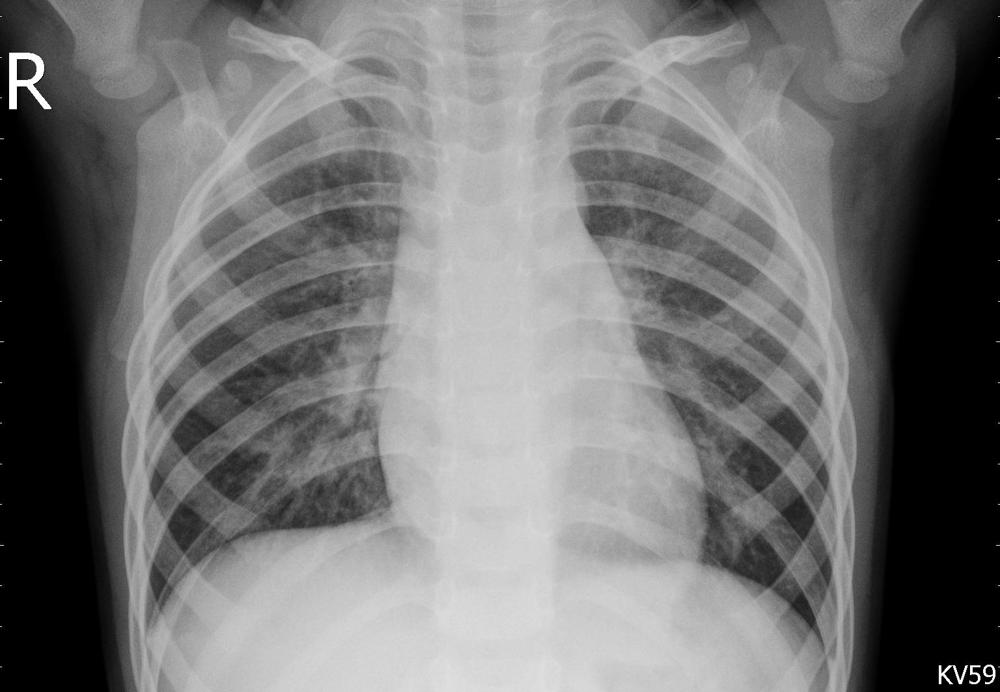

Uncalibrated Pneumonia Probability: 0.9507210344862049
Calibrated Pneumonia Probability: 0.9396063458887806
--------------------------
Image: chestCRXImages/chest_xray/test/NORMAL/NORMAL-630880-0001.jpeg
Label: 0


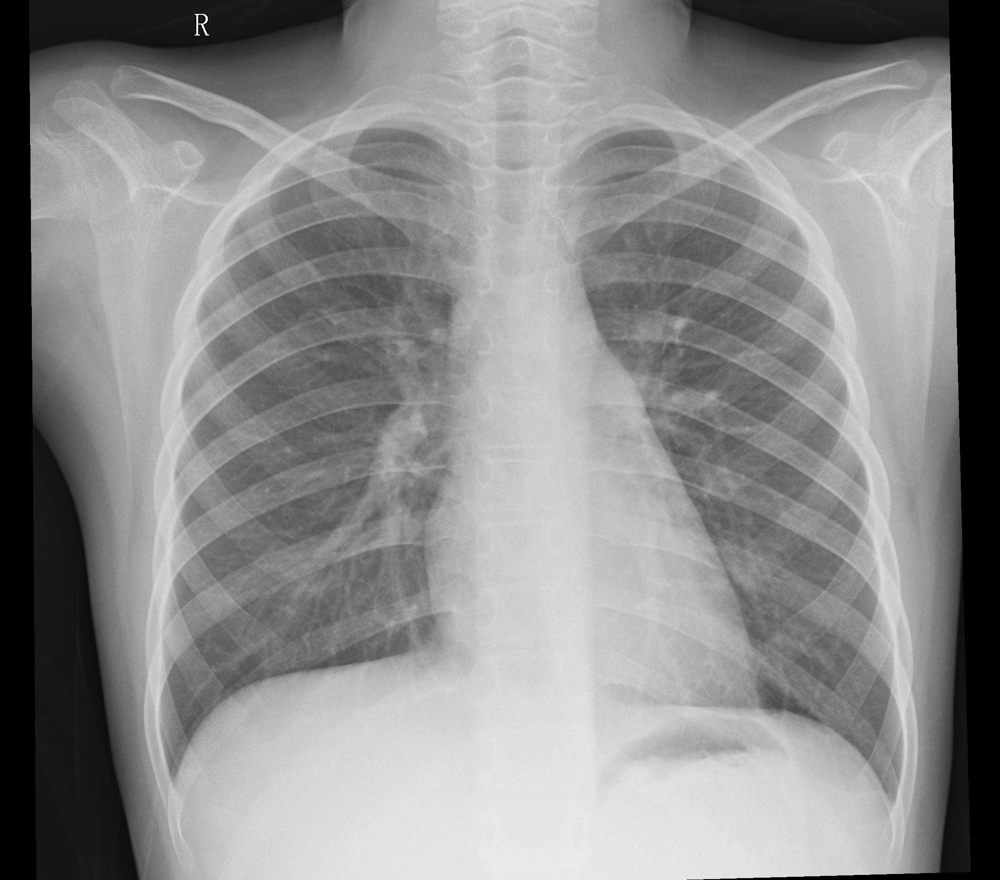

Uncalibrated Pneumonia Probability: 0.8712555385954821
Calibrated Pneumonia Probability: 0.8828038394175102
--------------------------
Image: chestCRXImages/chest_xray/test/NORMAL/NORMAL-4315572-0001.jpeg
Label: 0


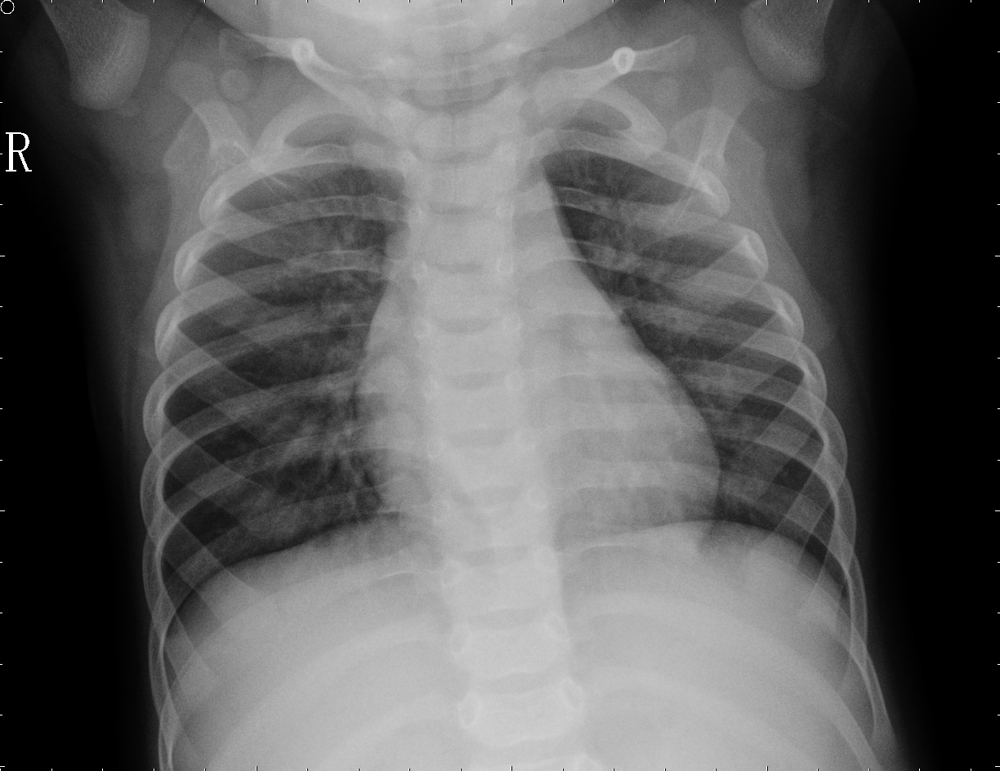

Uncalibrated Pneumonia Probability: 0.8219498789855713
Calibrated Pneumonia Probability: 0.8416779295391046
--------------------------
Image: chestCRXImages/chest_xray/test/PNEUMONIA/BACTERIA-9673743-0001.jpeg
Label: 1


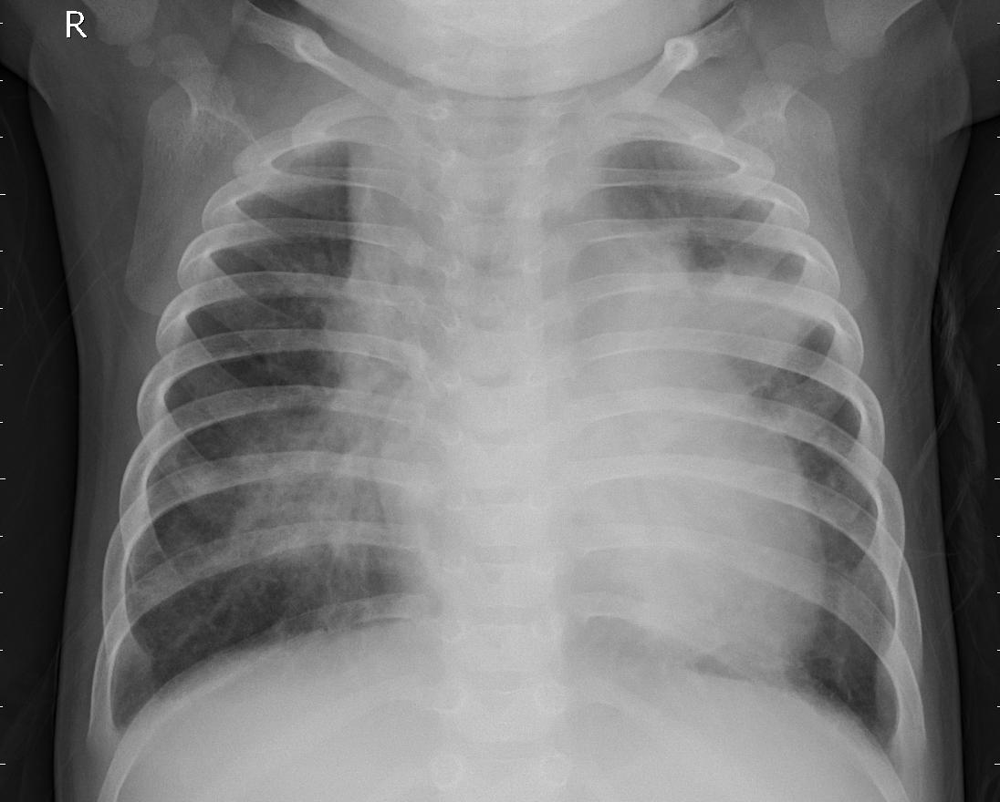

Uncalibrated Pneumonia Probability: 0.9995540631368922
Calibrated Pneumonia Probability: 0.9928922463476831


In [57]:
from sagemaker.serializers import IdentitySerializer

predictor.serializer = IdentitySerializer("image/jpeg")
jpeg_serializer = IdentitySerializer("image/jpeg")

session = boto3.Session()
s3_client = session.client('s3')
s3 = boto3.resource('s3')   


test_len = len(test_data)
sample_index = random.sample(range(test_len), 5)

sample_images = [test_data[index] for index in sample_index]
sample_labels = [test_y[index] for index in sample_index]


from PIL import Image
import numpy as np
bucket_name = bucket
bucket_ = s3.Bucket(bucket_name)
uncalibrated_Pneumonia_probabilities_test = []
for file, label in zip(sample_images, sample_labels):
    print("--------------------------")
    print("Image: " + file)
    print("Label: " + str(label))
    object = bucket_.Object(file)
    response = object.get()
    file_stream = response['Body']
    img = Image.open(file_stream).convert('RGB')
    display(img)
    count += 1
    
    s3_object = s3_client.get_object(Bucket = bucket_name, Key = file)
    body = s3_object['Body']
    content = body.read()
    response = predictor.predict(content, initial_args={'ContentType':'image/jpeg'})
    probs = softmax(response[0])
    uncalibrated_Pneumonia_probability = probs[1]
    print("Uncalibrated Pneumonia Probability: " + str(uncalibrated_Pneumonia_probability))
    calibrated_Pneumonia_probability = betaCalibration.predict([uncalibrated_Pneumonia_probability])
    print("Calibrated Pneumonia Probability: " + str(calibrated_Pneumonia_probability[0]))
    prediction = np.argmax(response[0]) + 1 
    prediction = 'NORMAL' if np.argmax(response[0]) == 0 else 'PNEUMONIA' 
    

<h2>References:</h2>

- Medical imaging in personalized medicine: a white paper of the research committee of the 
European Society of Radiology (ESR). Insights Imaging 6, 141–155 (2015). 
https://doi.org/10.1007/s13244-015-0394-0 
- E. Sogancioglu et. al., Deep Learning for Chest X-ray Analysis: A Survey, Medical Image Analysis, 
arXiv:2103.08700 
- Raoof, S., Feigin, D., Sung, A., Raoof, S., Irugulpati, L., Rosenow, E.C., 2012. Interpretation of 
plain chest roentgenogram. Chest 141, 545–558. doi:10. 1378/chest.10-1302 
Balabanova, Y., Coker, R., Fedorin, I., Zakharova, S., Plavinskij, S., Krukov, N., Atun, R., 
Drobniewski, F., 2005. Variability in interpretation of chest radiographs among russian clinicians 
and implications for screening programmes: observational study. BMJ 331, 379–382. 
doi:10.1136/bmj. 331.7513.379 
- Kermany DS, et. al., Identifying Medical Diagnoses and Treatable Diseases by Image-Based Deep 
Learning. Cell. 2018 Feb 22;172(5):1122-1131.e9. doi: 10.1016/j.cell.2018.02.010. PMID: 
29474911.